1. Noise Addition  
ref: https://medium.com/analytics-vidhya/adding-noise-to-audio-clips-5d8cee24ccb8

In [11]:
import librosa
def load_audio(file_path, sr=44100):
    y, sr = librosa.load(file_path, sr=sr)
    return y, sr

In [12]:
import numpy as np
import math
SNR = 20 # optimal SNR

def get_white_noise(signal,SNR) :
    #RMS value of signal
    RMS_s=math.sqrt(np.mean(signal**2))
    #RMS values of noise
    RMS_n=math.sqrt(RMS_s**2/(pow(10,SNR/10)))
    #Additive white gausian noise. Thereore mean=0
    #Because sample length is large (typically > 40000)
    #we can use the population formula for standard daviation.
    #because mean=0 STD=RMS
    STD_n=RMS_n
    noise=np.random.normal(0, STD_n, signal.shape[0])
    return noise

In [13]:
def signal_with_noise(signal,SNR):
    noise = get_white_noise(signal,SNR)
    return signal + noise

In [14]:
test_audio_path = './聲音資料/鯨魚/M3/20201017_023137.wav'

In [15]:
signal , sr = load_audio(test_audio_path)
signal_noise = signal_with_noise(signal, SNR)

In [16]:
import matplotlib.pyplot as plt
def compared_data_by_mel_spectrogram(signal, signal_noise, sr):
    plt.figure(figsize=(10, 4))
    plt.subplot(1,2,1)
    spec = librosa.feature.melspectrogram(y=signal)
    spec = librosa.power_to_db(spec)
    fig = librosa.display.specshow(spec, x_axis='time', y_axis='mel', cmap='viridis')
    plt.title('Original Signal')

    plt.subplot(1,2,2)
    spec = librosa.feature.melspectrogram(y=signal_noise)
    spec = librosa.power_to_db(spec)
    fig = librosa.display.specshow(spec, x_axis='time', y_axis='mel', cmap='viridis')
    plt.title('Noise Signal')
    return fig

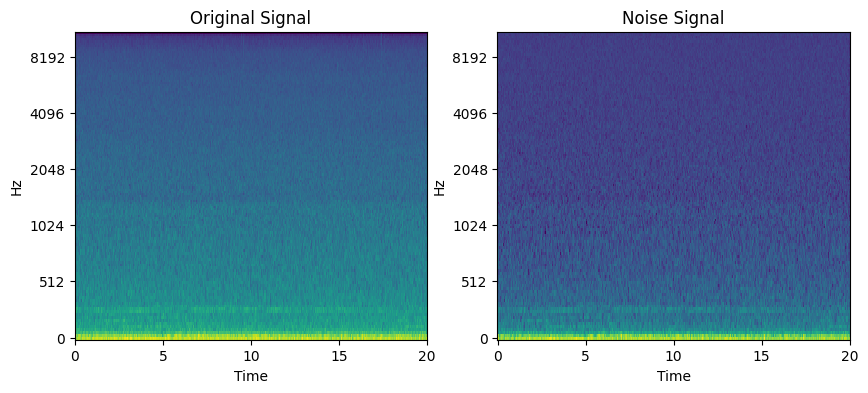

In [17]:
compared_data_by_mel_spectrogram(signal, signal_noise, sr)

In [18]:
def compared_data_by_waveform(signal, signal_noise):
    plt.figure(figsize=(10, 4))
    plt.subplot(1,2,1)
    fig = librosa.display.waveshow(signal, sr=sr)
    plt.title("Original Signal Waveform")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    plt.subplot(1,2,2)
    fig = librosa.display.waveshow(signal_noise, sr=sr)
    plt.title("Noise Signal Waveform")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    return fig

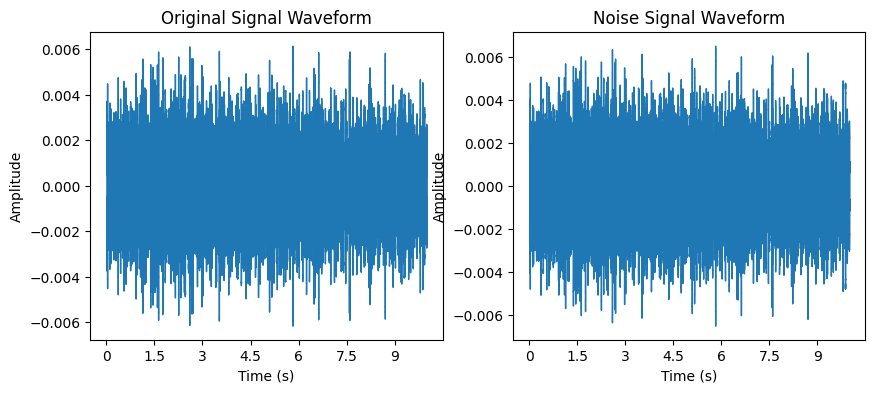

In [19]:
compared_data_by_waveform(signal, signal_noise)

感覺加的不明顯，改用  
ref: https://medium.com/@makcedward/data-augmentation-for-audio-76912b01fdf6

In [20]:
import numpy as np
def manipulate(data, noise_factor):
    noise = np.random.randn(len(data))  # random assign value by normal distribution
    augmented_data = data + noise_factor * noise
    # Cast back to same data type
    augmented_data = augmented_data.astype(type(data[0]))
    return augmented_data

In [21]:
noise_factor = 0.3
signal_noise = signal_with_noise(signal, noise_factor)

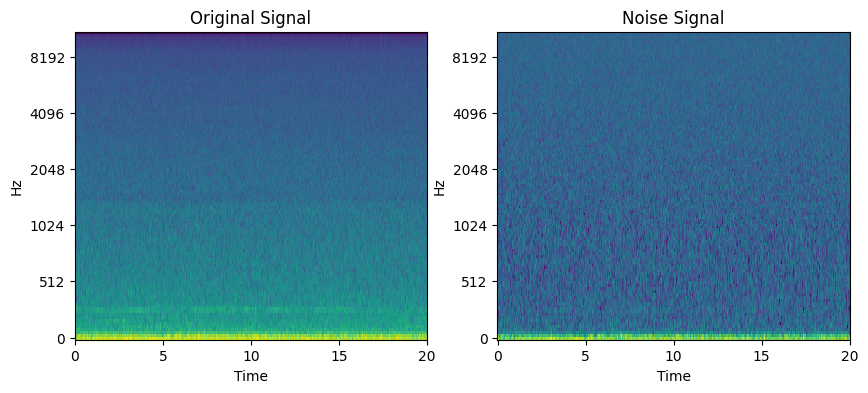

In [22]:
compared_data_by_mel_spectrogram(signal, signal_noise, sr)

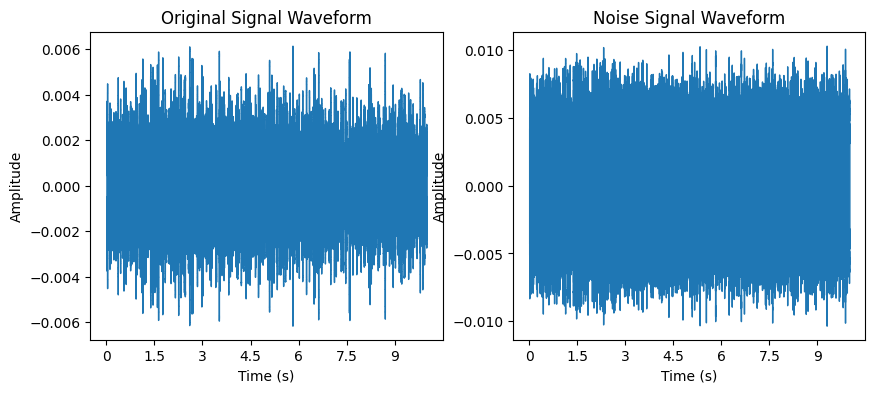

In [23]:
compared_data_by_waveform(signal, signal_noise)

2. Change Pitch  
ref:https://medium.com/@makcedward/data-augmentation-for-audio-76912b01fdf6

In [24]:
# 這邊不知道怎麼設，就用預設值
def pitch(data, sampling_rate=44100, n_steps=12):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=n_steps)

In [25]:
signal_modified_pitch = pitch(signal, sr)

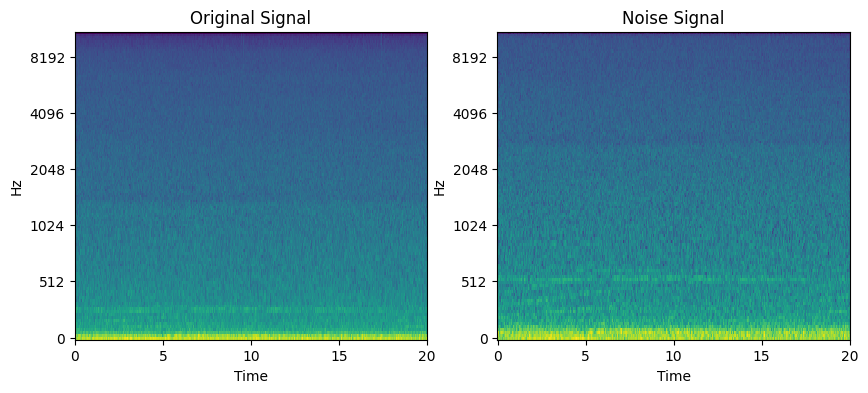

In [26]:
compared_data_by_mel_spectrogram(signal, signal_modified_pitch, sr)

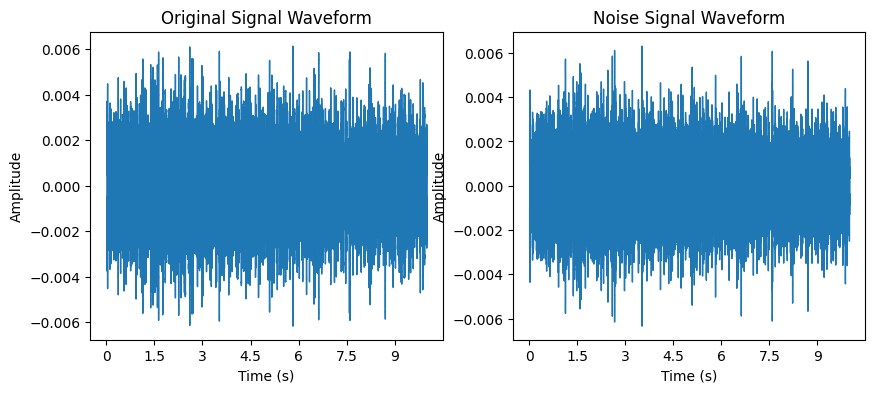

In [27]:
compared_data_by_waveform(signal, signal_modified_pitch)

In [28]:
import IPython.display as ipd
def compared_by_listen_audio(signal, signal_noise, sr):
    print("Original Signal")
    ipd.display(ipd.Audio(signal, rate=sr))
    print("Noise Signal")
    ipd.display(ipd.Audio(signal_noise, rate=sr))

有變大聲的感覺

In [29]:
compared_by_listen_audio(signal, signal_modified_pitch, sr)

Original Signal


Noise Signal


3. Time stretch (speed up)

In [30]:
def speed_change(data, speed_factor=1.0):
    return librosa.effects.time_stretch(data, rate=speed_factor)

In [31]:
speed_up_signal = speed_change(signal, 1.5)

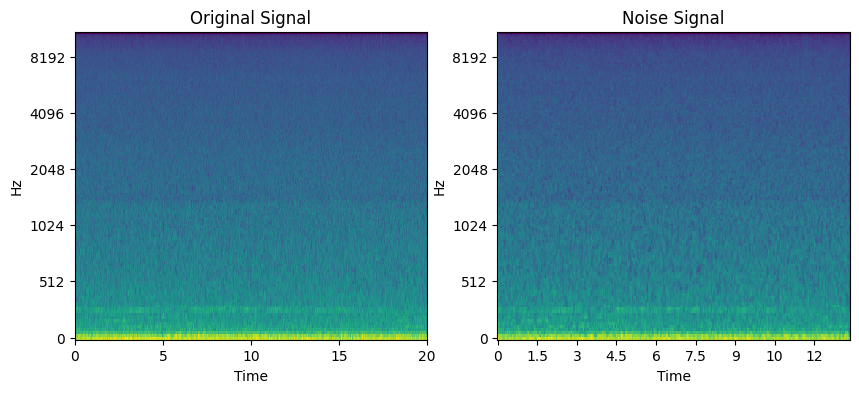

In [32]:
compared_data_by_mel_spectrogram(signal, speed_up_signal, sr)

4. Time shifting  
Here, I used `circular shift`

In [33]:
def shift(data, shift_amount):
    return np.roll(data, shift_amount)

In [34]:
# ref: https://medium.com/@keur.plkar/audio-data-augmentation-in-python-a91600613e47
shift_signal = shift(signal, sr//10)

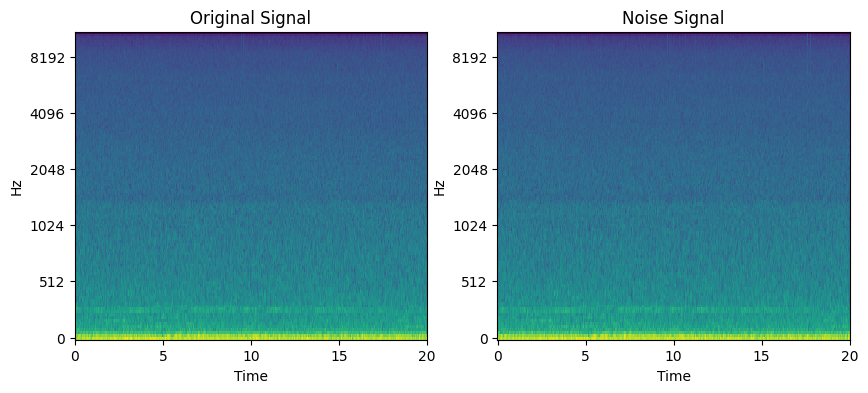

In [35]:
compared_data_by_mel_spectrogram(signal, shift_signal, sr)

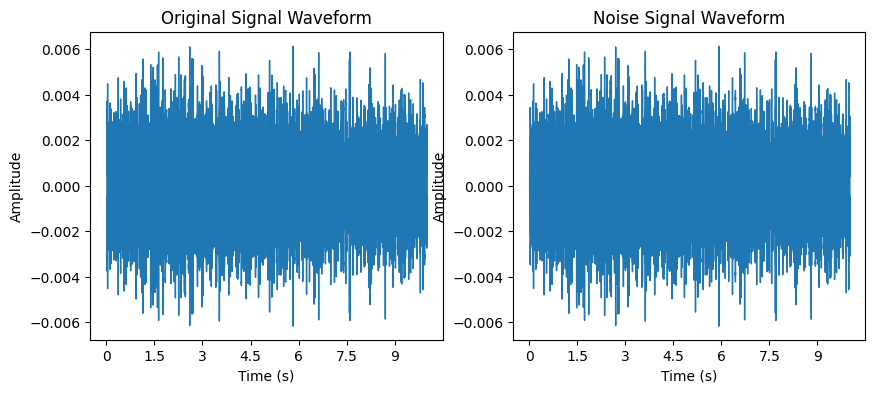

In [36]:
compared_data_by_waveform(signal, shift_signal)

In [37]:
compared_by_listen_audio(signal, shift_signal, sr)

Original Signal


Noise Signal


5. denoise

In [74]:
import noisereduce as nr
N_FFT = 2048
HOP_LEN = 512
def denoise(audio, sr=44100):
    reduced_noise = nr.reduce_noise(y=audio, sr=sr, stationary=True, prop_decrease=0.9, n_fft=N_FFT, hop_length=HOP_LEN)
    return reduced_noise

In [75]:
denoise_signal = denoise(signal)

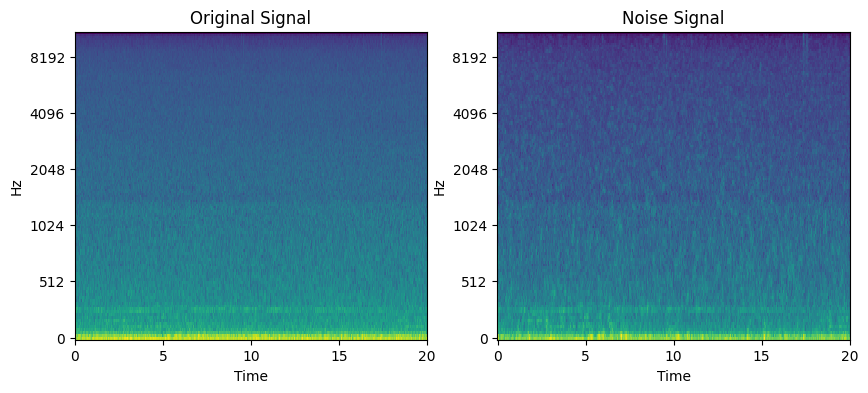

In [76]:
compared_data_by_mel_spectrogram(signal, denoise_signal, sr)

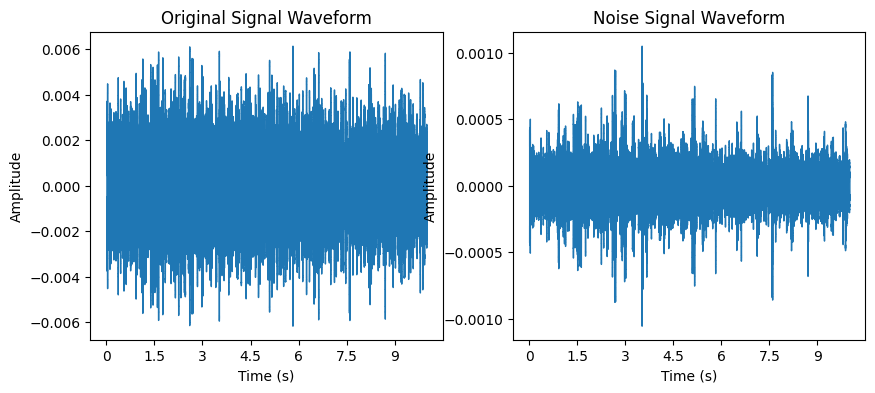

In [77]:
compared_data_by_waveform(signal, denoise_signal)

In [64]:
compared_by_listen_audio(signal, denoise_signal, sr)

Original Signal


Noise Signal


我想測試如果先降躁在資料擴充會怎樣?

In [65]:
manipulate_signal = manipulate(denoise_signal, 0.3)

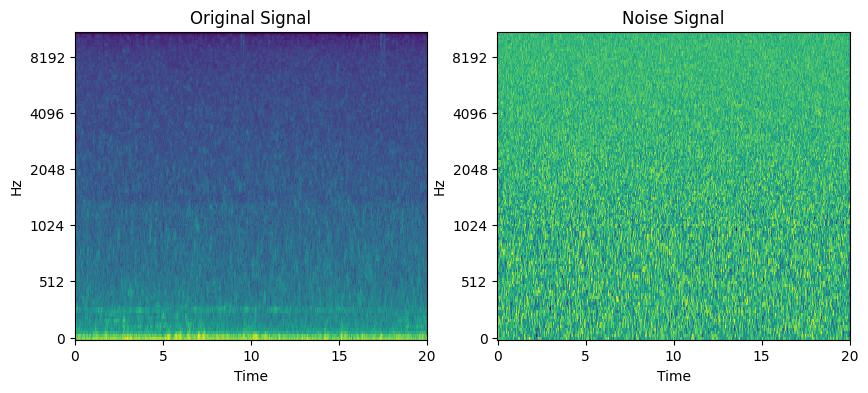

In [78]:
compared_data_by_mel_spectrogram(denoise_signal, manipulate_signal, sr)

套用加噪音 我覺得不好

In [68]:
pitch_denoise = pitch(denoise_signal, sr)

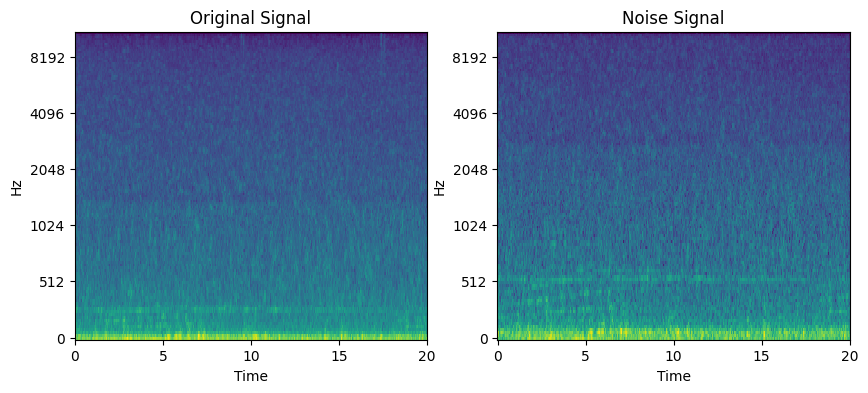

In [70]:
compared_data_by_mel_spectrogram(denoise_signal, pitch_denoise, sr)

In [71]:
compared_by_listen_audio(denoise_signal, pitch_denoise, sr)

Original Signal


Noise Signal


In [72]:
shift_denoise = shift(denoise_signal, sr//10)

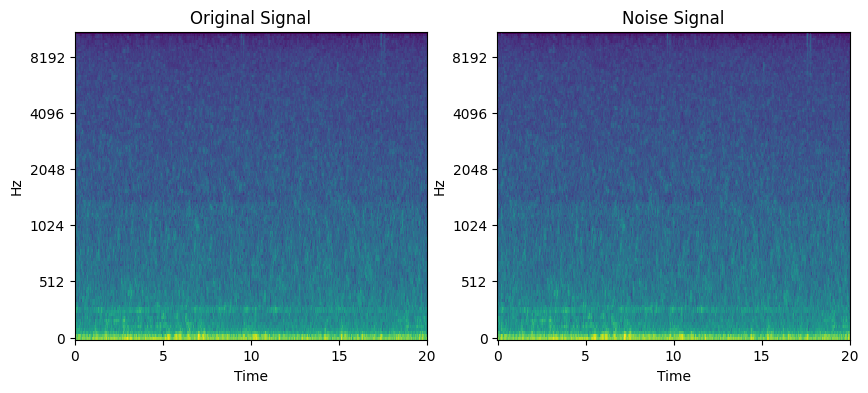

In [73]:
compared_data_by_mel_spectrogram(denoise_signal, shift_denoise, sr)